# 문제 1
- 그룹 단어 체커
- https://www.acmicpc.net/problem/1316

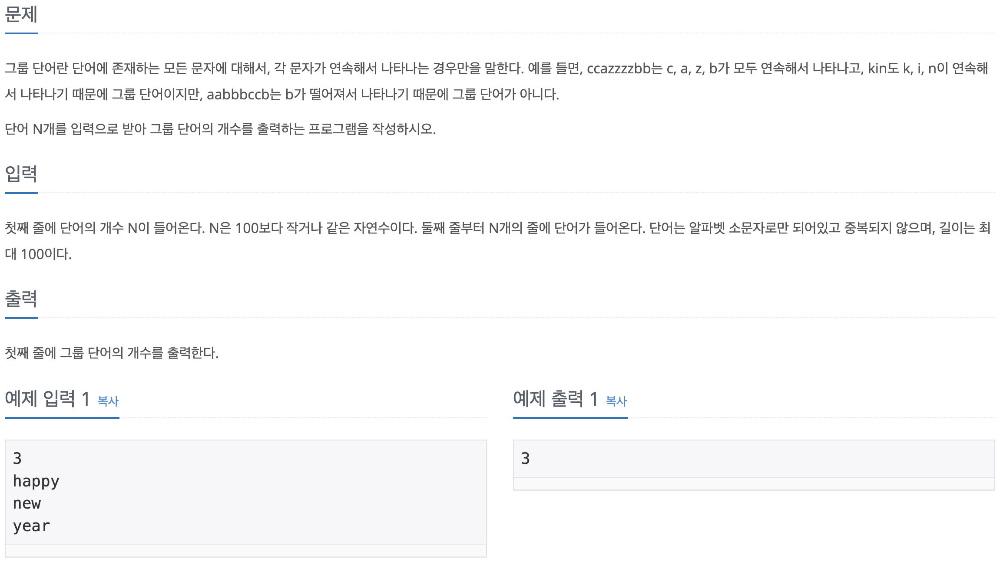

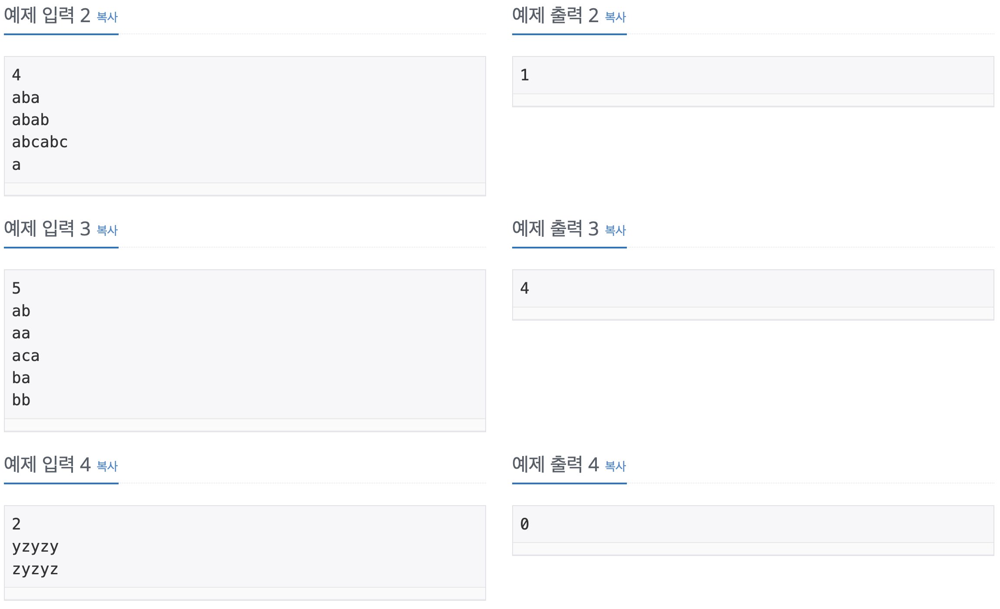

- 나왔던 문자열들을 기록하는 tmp를 추가
- 검색하려는 문자와 가장 최근에 나왔던 문자가 같으면 okay
- 검색하려는 문자와 가장 최근에 나왔던 문자가 다른데, tmp에 없다면 okay
- 검색하려는 문자와 가장 최근에 나왔던 문자가 다른데, tmp에 이미 있다면 no

In [ ]:
string_list = []

N = int(input())
for _ in range(N):
    string_list.append(input())

cnt = 0
for each in string_list:
    tmp = []
    Flag = True
    for c in each:
        if c not in tmp:
            tmp.append(c)
        else:
            if c != tmp[-1]:
                Flag = False
    
    if Flag:
        cnt += 1

print(cnt)

# 문제 2
- 2048 (Easy)
- https://www.acmicpc.net/problem/12100

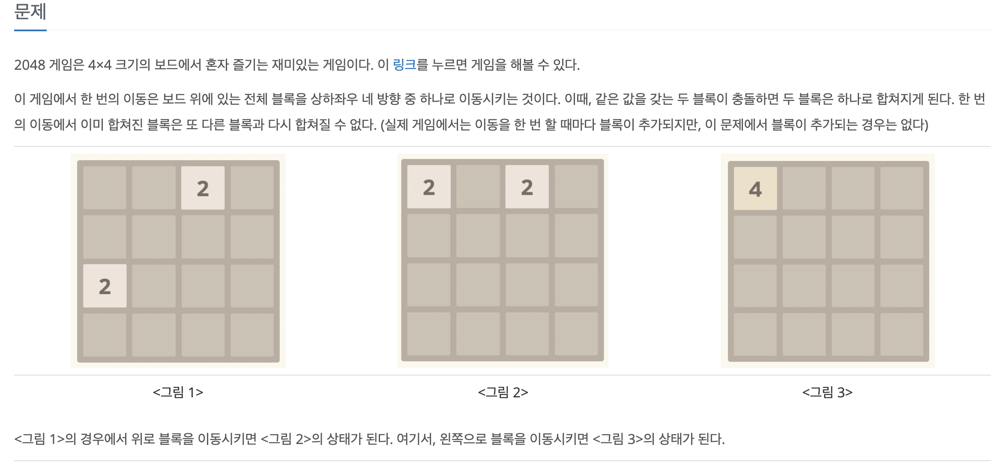

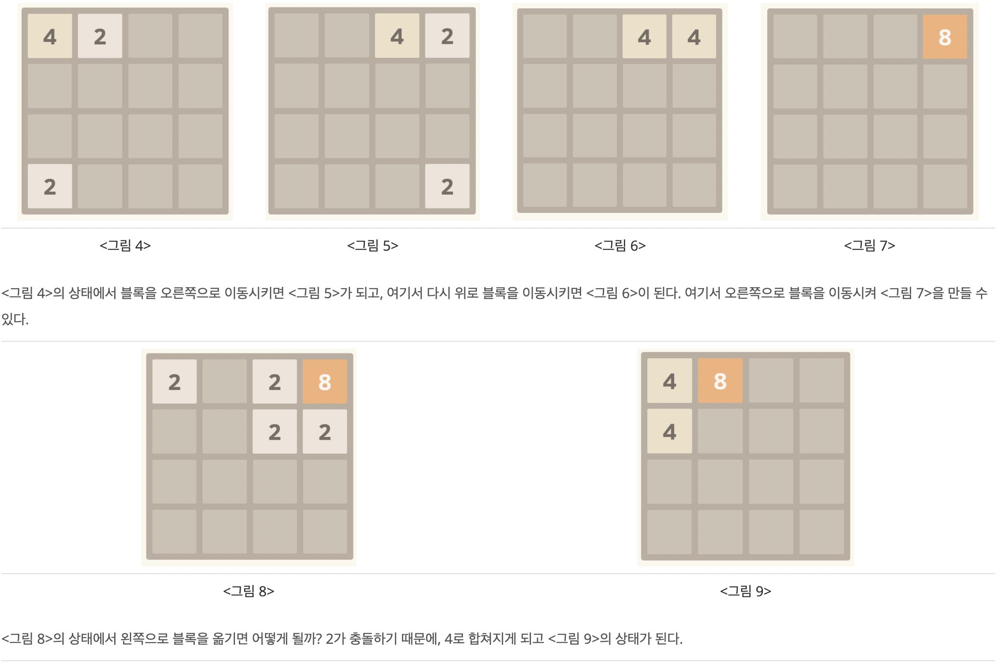

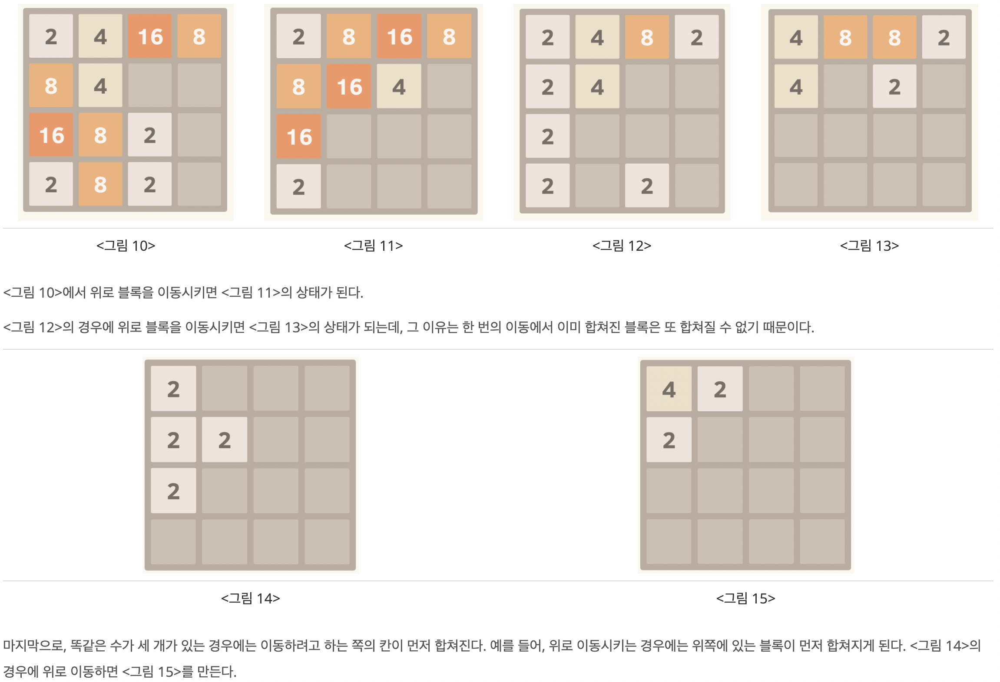

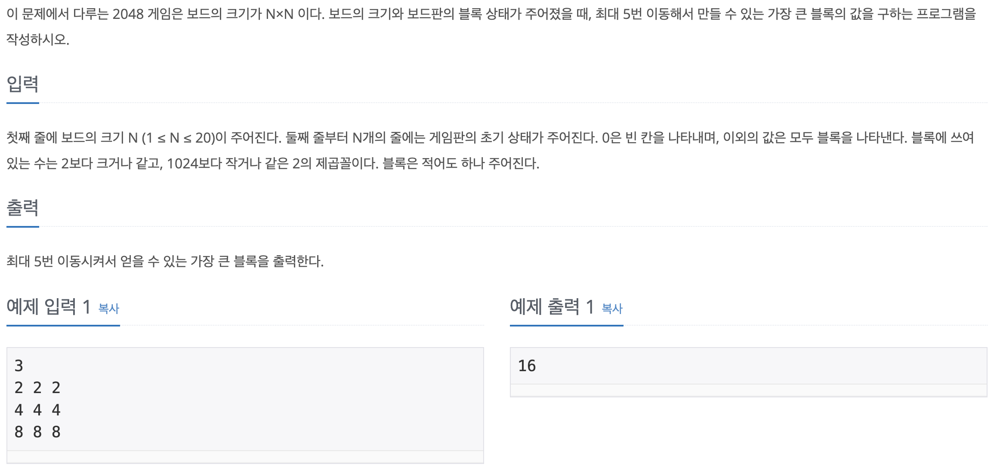

## DFS / BFS에 매우 취약
- 탐색문제임을 알아도 어떻게 구현할지 감조차 잡지 못하는 단계..
- 코드 참고하면서 공부하기로 결정
- https://cijbest.tistory.com/86

- 꼼꼼히 들여다보고 꼭 혼자서 해보기

In [ ]:
import sys
from copy import deepcopy
input = sys.stdin.readline

# INPUT
n = int(input())
board = [list(map(int, input().split())) for _ in range(n)]
answer = 0

# UP
def up(board):
    for j in range(n):
        pointer = 0
        for i in range(1, n):
            if board[i][j]:
                tmp = board[i][j]
                board[i][j] = 0
                # 포인터가 가리키는 수가 0일 때
                if board[pointer][j] == 0:
                    board[pointer][j] = tmp
                # 포인터가 가리키는 수와 현재 위치의 수가 같을 때
                elif board[pointer][j]  == tmp:
                    board[pointer][j] *= 2
                    pointer += 1
                # 포인터가 가리키는 수와 현재 위치의 수가 다를 때
                else:
                    pointer += 1
                    board[pointer][j] = tmp
    return board

# DOWN
def down(board):
    for j in range(n):
        pointer = n - 1
        for i in range(n - 2, -1, -1):
            if board[i][j]:
                tmp = board[i][j]
                board[i][j] = 0
                if board[pointer][j] == 0:
                    board[pointer][j] = tmp
                elif board[pointer][j]  == tmp:
                    board[pointer][j] *= 2
                    pointer -= 1
                else:
                    pointer -= 1
                    board[pointer][j] = tmp
    return board

# LEFT
def left(board):
    for i in range(n):
        pointer = 0
        for j in range(1, n):
            if board[i][j]:
                tmp = board[i][j]
                board[i][j] = 0
                if board[i][pointer] == 0:
                    board[i][pointer] = tmp
                elif board[i][pointer]  == tmp:
                    board[i][pointer] *= 2
                    pointer += 1
                else:
                    pointer += 1
                    board[i][pointer]= tmp
    return board

# RIGHT
def right(board):
    for i in range(n):
        pointer = n - 1
        for j in range(n - 2, -1, -1):
            if board[i][j]:
                tmp = board[i][j]
                board[i][j] = 0
                if board[i][pointer] == 0:
                    board[i][pointer] = tmp
                elif board[i][pointer]  == tmp:
                    board[i][pointer] *= 2
                    pointer -= 1
                else:
                    pointer -= 1
                    board[i][pointer] = tmp
    return board


# DFS
def dfs(board, cnt):
    if cnt == 5:
        # 2차원 배열 요소 중 가장 큰 값 반환
        return max(map(max, board))

    # 상, 하, 좌, 우로 움직여 리턴한 값들 중 가장 큰 값 반환
    # board를 꼭 deepcopy하여 함수를 거친 board값이 다음 함수에 들어가지 못하도록 해주어야 한다.
    return max(dfs(up(deepcopy(board)), cnt + 1), dfs(down(deepcopy(board)), cnt + 1), dfs(left(deepcopy(board)), cnt + 1), dfs(right(deepcopy(board)), cnt + 1))

print(dfs(board, 0))

# 문제 3
- 사다리 조작
- https://www.acmicpc.net/problem/15684

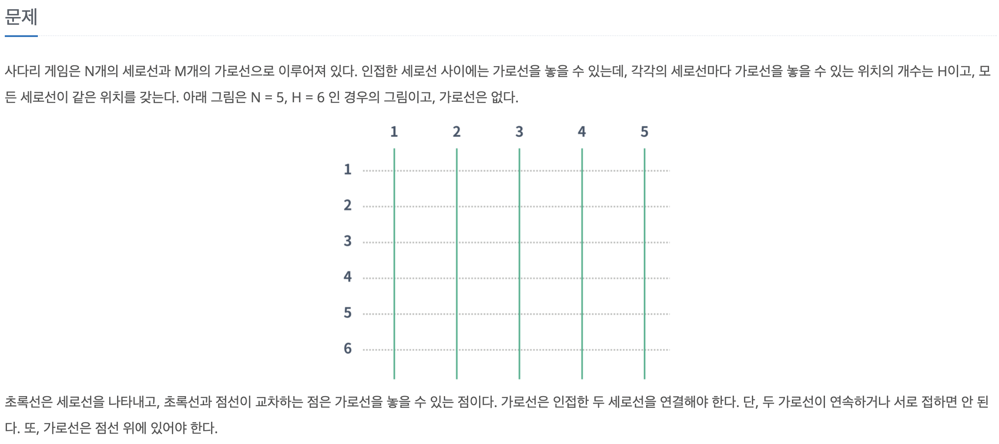

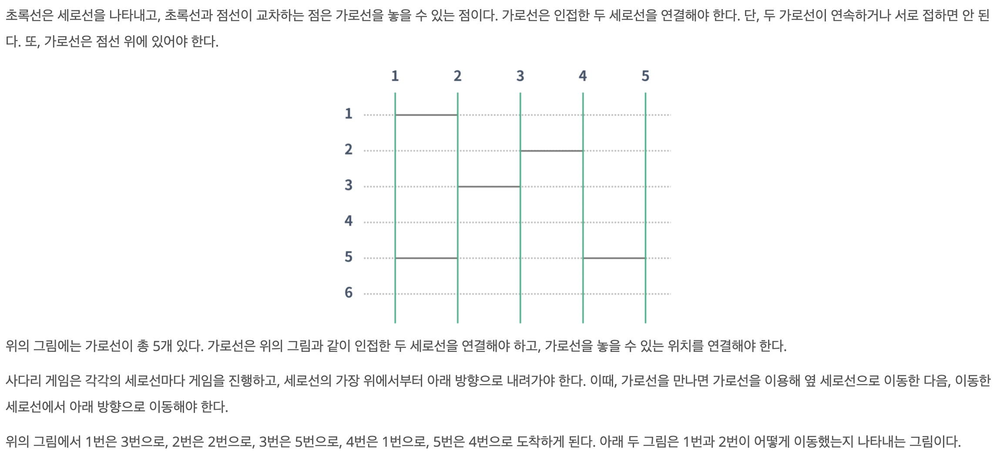

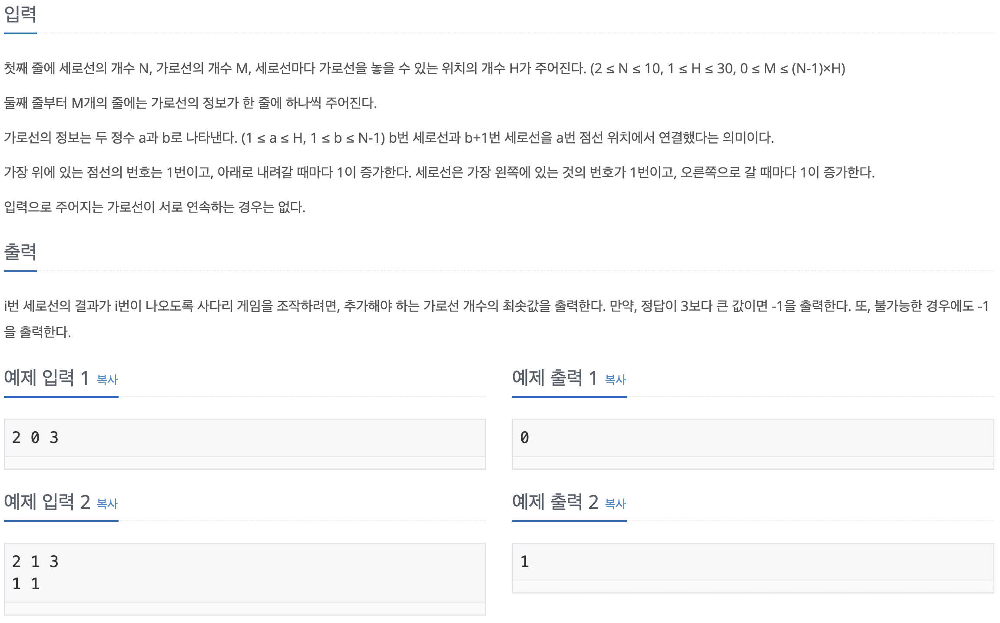

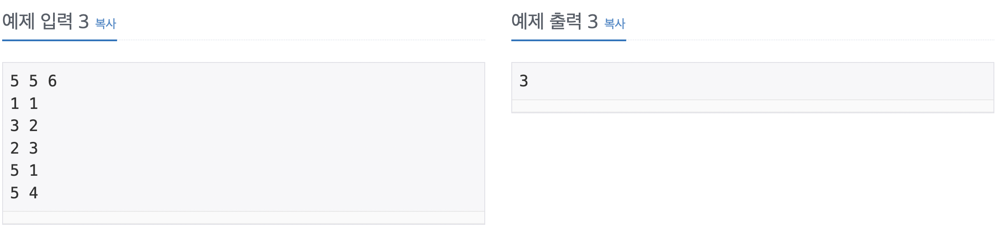

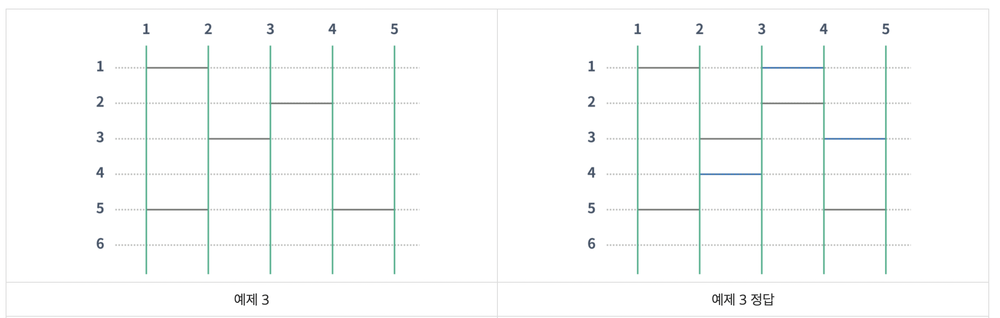

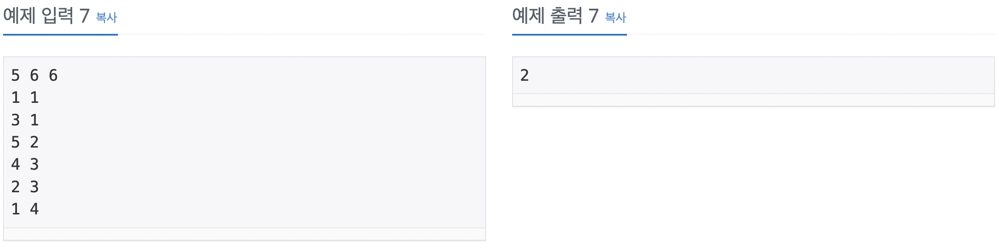

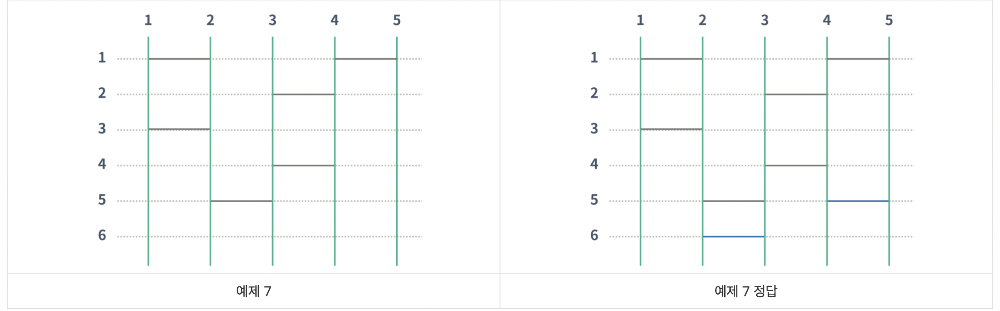

### 스텝

- 1) 0과 1로 사다리의 다리가 없는 부분과 있는 부분을 구현한다
- 2) 1을 만나면 1이 있는 방향으로 꺾어 내려가고 올라오는 함수를 작성한다
- 3) 시작 위치와 끝 위치가 다른 번호들의 특정 경로에 사다리를 추가한다
- 4) 완성된 사다리의 1의 개수를 2로 나누어 주어진 다리 개수(M)를 빼면, 추가된 다리 개수를 구할 수 있다
    - (ladder의 합) // 2 - M = answer

In [ ]:
N,M,H = map(int, input().split())
ladder = []
for _ in range(H+1):
    ladder.append([0]*N)

for _ in range(M):
    x,y = map(int, input().split())
    ladder[x][y-1] = 1
    ladder[x][y] = 1
    
ladder

In [ ]:
# top, bottom에서 부터의 시작 위치 인덱스로 설정
top = []
for i in range(N):
    top.append([0,i])

bottom = []
for i in range(N):
    bottom.append([H+1,i])

print(top)
print(bottom)

In [ ]:
# up, down 함수 작성 (지나간 경로를 return)
def down(index):
    x,y = index[0],index[1]
    path= [[x,y]]
    while True:
        x += 1
        path.append([x,y]) # 무조건 한 칸 내려옴 -> 사다리를 탈것이냐 vs 한 칸 더 내려갈것이냐
        if x == H+1:
            break
        
        if ladder[x][y] == 1: # 사다리가 놓여져있다면, 좌,우로 한 칸씩 움직여라
            
            if y == 0:
                if ladder[x][y+1] == 1:
                    y += 1
                    path.append([x,y])
            
            elif y == N-1:
                if ladder[x][y-1] == 1:
                    y -= 1
                    path.append([x,y])
            
            else:
                if ladder[x][y+1] == 1:
                    y += 1
                    path.append([x,y])
                elif ladder[x][y-1] == 1:
                    y -= 1
                    path.append([x,y])
    
    return path
# 가장 왼쪽 or 가장 오른쪽에서 index range 오류가 났던 코드
#             if (y == 0) or ladder[x][y+1] == 1:
#                 y += 1
#                 path.append([x,y])
#                 #print(path)
                
#             elif (y == N-1) or ladder[x][y-1] == 1:
#                 y -= 1
#                 path.append([x,y])
#                 #print(path)

In [ ]:
def up(index):
    x,y = index[0],index[1]
    path= [[x,y]]
    while True:
        x -= 1
        path.append([x,y]) # 무조건 한 칸 올라옴 -> 사다리를 탈것이냐 vs 한 칸 더 올라갈것이냐
        if x == 0:
            break
        
        if ladder[x][y] == 1: # 사다리가 놓여져있다면, 좌,우로 한 칸씩 움직여라
            
            if y == 0:
                if ladder[x][y+1] == 1:
                    y += 1
                    path.append([x,y])
            
            elif y == N-1:
                if ladder[x][y-1] == 1:
                    y -= 1
                    path.append([x,y])
            
            else:
                if ladder[x][y+1] == 1:
                    y += 1
                    path.append([x,y])
                elif ladder[x][y-1] == 1:
                    y -= 1
                    path.append([x,y])
    
    return path

In [ ]:
# 옆으로 이동한 경로들은 제거해주기 (x좌표 값들이 중복인것들)
# 제거된 경로들중에서 사다리를 추가할 좌표를 선정해야 하기 때문에
def remove_path(path_list):
    remove_idx = []
    tmp = path_list[0][0]
    for i,each in enumerate(path_list[1:]):    
        if each[0] == tmp:
            remove_idx.append(i)
            remove_idx.append(i+1)
        else:
            tmp = each[0]
    remove_idx.sort(reverse = True)
    for idx in remove_idx:
        path_list.pop(idx)
    
    path_list.sort()
    return path_list

In [ ]:
for t,b in zip(top,bottom):
    down_path = down(t)
    up_path = up(b)
    
    r_down = remove_path(down_path)
    r_up = remove_path(up_path)
    
    cnt = 0
    for d in r_down:
        if d[0] == 0 or d[0] == H+1:
            continue
        for u in r_up:
            if d[0] == u[0] and (d[1] == u[1]-1 or d[1] == u[1]+1):
                #print(d,u)
                ladder[d[0]][d[1]] = 1
                ladder[u[0]][u[1]] = 1
                cnt += 1

        if cnt == 1:
            break

tot_sum = 0
for row in ladder:
    tot_sum += sum(row)

answer = tot_sum // 2 - M
if answer > 3:
    answer = -1

elif answer == 0:
    for t,b in zip(top,bottom):
        down_path = down(t)
        up_path = up(b)

        miss_cnt = 0
        if down_path[0][-1] != up_path[-1][-1]:
            miss_cnt += 1
            break
    if miss_cnt > 0:
        answer = -1

print(answer)

---

### 제출 코드

In [ ]:
N,M,H = map(int, input().split())
ladder = []
for _ in range(H+1):
    ladder.append([0]*N)

for _ in range(M):
    x,y = map(int, input().split())
    ladder[x][y-1] = 1
    ladder[x][y] = 1

top = []
for i in range(N):
    top.append([0,i])

bottom = []
for i in range(N):
    bottom.append([H+1,i])

def down(index):
    x,y = index[0],index[1]
    path= [[x,y]]
    while True:
        x += 1
        path.append([x,y])
        if x == H+1:
            break
        
        if ladder[x][y] == 1:
            
            if y == 0:
                if ladder[x][y+1] == 1:
                    y += 1
                    path.append([x,y])
            
            elif y == N-1:
                if ladder[x][y-1] == 1:
                    y -= 1
                    path.append([x,y])
            
            else:
                if ladder[x][y+1] == 1:
                    y += 1
                    path.append([x,y])
                elif ladder[x][y-1] == 1:
                    y -= 1
                    path.append([x,y])
    return path

def up(index):
    x,y = index[0],index[1]
    path= [[x,y]]
    while True:
        x -= 1
        path.append([x,y])
        if x == 0:
            break
        
        if ladder[x][y] == 1:
            
            if y == 0:
                if ladder[x][y+1] == 1:
                    y += 1
                    path.append([x,y])
            
            elif y == N-1:
                if ladder[x][y-1] == 1:
                    y -= 1
                    path.append([x,y])
            
            else:
                if ladder[x][y+1] == 1:
                    y += 1
                    path.append([x,y])
                elif ladder[x][y-1] == 1:
                    y -= 1
                    path.append([x,y])
    
    return path

def remove_path(path_list):
    remove_idx = []
    tmp = path_list[0][0]
    for i,each in enumerate(path_list[1:]):    
        if each[0] == tmp:
            remove_idx.append(i)
            remove_idx.append(i+1)
        else:
            tmp = each[0]
    remove_idx.sort(reverse = True)
    for idx in remove_idx:
        path_list.pop(idx)
    
    path_list.sort()
    return path_list

for t,b in zip(top,bottom):
    down_path = down(t)
    up_path = up(b)
    
    r_down = remove_path(down_path)
    r_up = remove_path(up_path)
    
    cnt = 0
    for d in r_down:
        if d[0] == 0 or d[0] == H+1:
            continue
        for u in r_up:
            if d[0] == u[0] and (d[1] == u[1]-1 or d[1] == u[1]+1):
                ladder[d[0]][d[1]] = 1
                ladder[u[0]][u[1]] = 1
                cnt += 1

        if cnt == 1:
            break

tot_sum = 0
for row in ladder:
    tot_sum += sum(row)

answer = tot_sum // 2 - M
if answer > 3:
    answer = -1

elif answer == 0:
    for t,b in zip(top,bottom):
        down_path = down(t)
        up_path = up(b)

        miss_cnt = 0
        if down_path[0][-1] != up_path[-1][-1]:
            miss_cnt += 1
            break
    if miss_cnt > 0:
        answer = -1

print(answer)

In [ ]:
5 12 6
1 1
1 3
2 2
2 4
3 1
3 3
4 2
4 4
5 1
5 3
6 2
6 4

---
###### 테스트 코드들

In [ ]:
for t, b in zip(top,bottom):
    print('top:',t)
    print('bottom:',b)

In [ ]:
down_path = down([0,2])
up_path = up([5,2])

In [ ]:
ladder

In [ ]:
down_path

In [ ]:
up_path

In [ ]:
if down_path[0][-1] != up_path[-1][-1]: # 이미 만족한다면 건드려줄 필요가 없음
    pass

In [ ]:
r_down = remove_path(down_path)
r_up = remove_path(up_path)

In [ ]:
r_down

In [ ]:
r_up

In [ ]:
cnt = 0
for d in r_down:
    if d[0] == 0 or d[0] == H+1:
        continue
    for u in r_up:
        if d[0] == u[0] and (d[1] == u[1]-1 or d[1] == u[1]+1):
            print(d,u)
            ladder[d[0]][d[1]] = 1
            ladder[u[0]][u[1]] = 1
            cnt += 1
            
    if cnt == 1:
        break

In [ ]:
ladder

In [ ]:
tot_sum = 0
for row in ladder:
    tot_sum += sum(row)
    
answer = tot_sum // 2 - M
if answer > 3:
    answer = -1
    
print(answer)

In [ ]:
if answer == 0:
    for t,b in zip(top,bottom):
        down_path = down(t)
        up_path = up(b)

        miss_cnt = 0
        if down_path[0][-1] != up_path[-1][-1]:
            miss_cnt += 1
            break
    if miss_cnt > 0:
        answer = -1

print(answer)

### 실패 이유
- test case에서는 전부 통과했는데 오답처리 되어서 실제 예시를 만들며 반례를 찾은 문제
- 사다리를 타고 내려왔을 때, 해당 지점에 사다리가 연결 되어 있고 그 양 옆 모두 1로 표시되어있다면, 올바른 방향으로 타지 못한다.
- 양 옆 모두 1로 표시되어있다면, 이전 방향을 기억하거나 사다리 표현을 다르게 해야 할 듯
- 따라서 사다리가 연결된 부분을 1로 표시하기 보다는, -x-와 같이 표시하는게 좋아보인다..


- 비교
    - 11 11
    -  _ x _
    이런 식으로 구분을 지어줘야 올바른 방향으로 탈 수 있음

## 정답코드
- 주석 설명이 아주 잘 되어있어서 공부하기 편했다.
- https://baby-ohgu.tistory.com/3

In [ ]:
import sys

# 브루트포스로 가로선을 놓을 수 있는 곳에 가로선을 놓아보면서 매번 출발점에서 도착점으로 정상 도착 하는지 확인해야한다.
# N, M, H 제한이 크지 않아서 통과한 것 같다.
# 가로선과 세로선을 잘 구별해야한다. 문제에서 N은 세로선의 개수인데, 코드로 작성할 때 N은 배열에서 행이 아닌 열이다.

def check(): # i번 세로선이 i번으로 도착하는지 확인
    for start in range(N): # 1번부터 N번 세로선(열)까지 검사
        k = start # k는 이동하는 가로선
        for j in range(H): # 가로선(행) 이동
            if board[j][k]: # 가로선이 존재한다면
                k += 1 # 가로선 오른쪽으로 한칸 이동
            elif k > 0 and board[j][k - 1]: # 가로선이 왼쪽에 존재한다면
                k -= 1 # 가로선 왼쪽으로 한칸 이동
        if k != start: return False # 가장 하단까지 왔는데 k가 start랑 같지 않으면 정상 도착하지 않은 것이므로 return False
    return True

def dfs(cnt, x, y):
    global ans
    if check(): # 현재 상태에서 각 출발점이 도착점으로 잘 도착하는지 확인
        ans = min(ans, cnt)
        return
    elif cnt == 3 or ans <= cnt: # 도착점이 정상적이지 않으면
        # cnt 값이 3일 경우 그 다음 호출에서 cnt가 4가 되어 문제 조건 위반하므로 return
        # cnt 값이 ans 보다 크거나 같을 경우에는 그 다음 경우를 볼 필요가 없으므로 return
        return
    # 행
    for i in range(x, H):
        # 가로선을 우선으로 탐색하므로
        if i == x:
            k = y # 행이 변경되기 전에는 가로선을 계속해서 탐색
        else:
            k = 0 # 행이 변경될 경우 가로선 처음부터 탐색
        for j in range(k, N - 1): # 세로선(열)
            if not board[i][j] and not board[i][j + 1]: # 가로선을 놨을 때 오른쪽에 -가 존재하지 않는 경우
                if j > 0 and board[i][j - 1]: continue # 가로선을 놨을 때 왼쪽에 -가 존재할 경우 continue (--가 되면 안되기 때문)
                board[i][j] = True # 가로선 놓기
                dfs(cnt + 1, i, j + 2) # cnt 1 증가, 세로선 그대로, -- 이 되면 안되므로 가로선은 2증가
                board[i][j] = False # 가로선 없애기

if __name__ == '__main__':
    N, M, H = map(int, sys.stdin.readline().split())
    board = [[False] * N for _ in range(H)] # 특정 지점 방문 여부 체크
    if M == 0: # M이 0일 경우 출발점에서 도착점으로 바로 내려오므로 0 출력 후 종료
        print(0)
        exit(0)
    for _ in range(M):
        a, b = map(int, sys.stdin.readline().split())
        board[a - 1][b - 1] = True
    ans = 4 # 결과값 4로 초기화
    dfs(0, 0, 0)
    print(ans if ans < 4 else -1)